# <span style="color:#055C9D"> Import librairies: </span>

In [1]:
import pandas as pd
import numpy as np
from lightgbm.sklearn import LGBMRegressor # Machine learning model used
import matplotlib.pyplot as plt 

# <span style="color:#055C9D"> Dataset: </span>
## <span style="color:#0E86D4"> Load data: </span>

In [2]:
df=pd.read_csv("data_filtrage_5.csv")

## <span style="color:#0E86D4"> Transform dataset : </span>
The function get_variation allows to **add 6 more features** in our dataset.  
Each **variation feature** represents the variation between x and x+1 for a specific feature (such as x_tibia for instance).

In [3]:
def get_variation(df):
    
    x_lum_var=df.x_lumbar-df.x_lumbar.shift(periods=1, fill_value=df.x_lumbar[len(df)-1])
    y_lum_var=df.y_lumbar-df.y_lumbar.shift(periods=1, fill_value=df.y_lumbar[len(df)-1])
    z_lum_var=df.z_lumbar-df.z_lumbar.shift(periods=1, fill_value=df.z_lumbar[len(df)-1])
    x_tib_var=df.x_tibia-df.x_tibia.shift(periods=1, fill_value=df.x_tibia[len(df)-1])
    y_tib_var=df.y_tibia-df.y_tibia.shift(periods=1, fill_value=df.y_tibia[len(df)-1])
    z_tib_var=df.z_tibia-df.z_tibia.shift(periods=1, fill_value=df.z_tibia[len(df)-1])

    df_var= pd.DataFrame(
    {'var_x_lumbar': x_lum_var,
     'var_y_lumbar': y_lum_var,
     'var_z_lumbar': z_lum_var,
     'var_x_tibia': x_tib_var,
     'var_y_tibia': y_tib_var,
     'var_z_tibia': z_tib_var
    })

    return df.join(df_var)

In [4]:
df=get_variation(df) ##Add the 6 variation feature to our dataset
X=df.drop(['index','nb_seance','nb_passage','x_force','z_force','y_force'],axis=1) #Remove useless data and data to be predicted (platform data)
y=df['z_force'] #Plateform z_force measure (feature to predict with our model)

# <span style="color:#055C9D"> Run the model: </span>
## <span style="color:#0E86D4"> Leave one out cross-validation function: </span>
This validation method use as many folds as the number of instance(number of passage) in the dataset. Then the learning algorithm tests once each passage, using all other passage as training set.

In [5]:
from sklearn.metrics import mean_squared_error
def exceptOneValidation(model,X,y,period=5000):
    score=[]
    predict=[]
    error=[]
    for i in range(0,len(X),period):
        if i==0:
            X_train=X.iloc[period:,:]
            y_train=y.iloc[period:]
            X_test=X.iloc[0:period,:]
            y_test=y.iloc[0:period]
        elif i==len(X)-period:
            X_train=X.iloc[0:i,:]
            y_train=y.iloc[0:i]
            X_test=X.iloc[i:i+period,:]
            y_test=y.iloc[i:i+period]
        else:
            X_train=pd.concat([X.iloc[0:i,:],X.iloc[i+period:,:]],axis=0)
            y_train=pd.concat([y.iloc[0:i],y.iloc[i+period:]],axis=0)
            X_test=X.iloc[i:i+period,:]
            y_test=y.iloc[i:i+period]
        model.fit(X_train,y_train)
        y_pred=model.predict(X_test)
        predict=np.concatenate([predict,y_pred])
        score.append(model.score(X_test,y_test))
        error.append(mean_squared_error(y_test,y_pred))
    return score,error,predict

## <span style="color:#0E86D4"> Retrieve results: </span>

In [6]:
lgbmr=LGBMRegressor(boosting_type='goss',random_state=42,n_estimators=300,learning_rate=0.2,n_jobs=-1)
score_lgbmr,error_lgbmr,predict_lgbmr=exceptOneValidation(lgbmr,X,y)
df['z_pred']=predict_lgbmr

In [7]:
from sklearn.metrics import mean_squared_error, r2_score
print("MSE:",round(mean_squared_error(df['z_force'],df['z_pred'])**(1/2),),'N')
print("Score:", round(r2_score(df['z_force'],df['z_pred']),5)*100,'%')

MSE: 49 N
Score: 99.083 %


# <span style="color:#055C9D"> Increasing the score: </span>
## <span style="color:#0E86D4"> Looking at the predictions: </span>
The idea is to plot each passage's prediction with the mean prediction to compare them and check if some prediction are significantly different.

## Creation of a "mean passage" list:
A 5000 points list: each point represents the mean of the 100 passages preditions

In [8]:
list_sum=[0]*5000
for i in range(100):
    list_sum+=df['z_force'].iloc[i*5000:i*5000+5000].reset_index(drop=True)
list_mean=list_sum/100

In [12]:
perf_pred=75

## Checking if the drops come from the input
Did it by looking manually

### Comparing input on satisfying prediction vs. prediction with  dropouts
#### For lumbar:  
*(blue: x_lumbar, green: y_lumbar, red: z_lumbar)*
- Light colors= prediction with drops (input)  
- Deep colors= "perfect" prediction (input)   

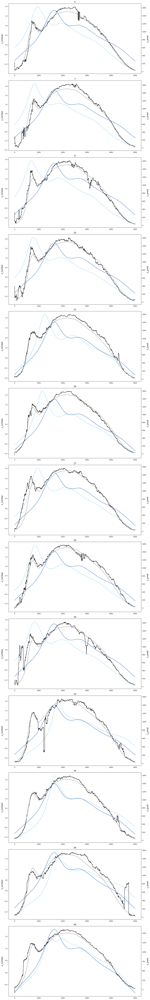

In [25]:
fig, ax = plt.subplots(nrows=len(list1), figsize=(13.8,len(list1)*7))
k=perf_pred
for i in list1:
    ind = list1.index(i)
    ax2 = ax[ind].twinx()
    ax[ind].plot(df['x_lumbar'].iloc[i*5000:i*5000+5000].reset_index(drop=True), color='#89CFEF')

    ax[ind].plot(df['x_lumbar'].iloc[k*5000:k*5000+5000].reset_index(drop=True), color='#0F52BA')

    ax[ind].set_ylabel('x_lumbar',fontsize=14)
    ax2.plot( df['z_pred'].iloc[i*5000:i*5000+5000].reset_index(drop=True),color='black')
    ax2.plot(y.iloc[k*5000:k*5000+5000].reset_index(drop=True), color='grey')
    ax2.set_ylabel('z_pred ',color='black',fontsize=14)
    ax[ind].set_title(i, size=14)
    ax[ind].xaxis.set_tick_params(labelsize=10)
    ax[ind].yaxis.set_tick_params(labelsize=10)

plt.tight_layout()

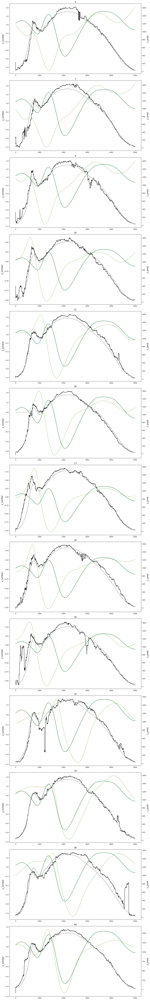

In [28]:
fig, ax = plt.subplots(nrows=len(list1), figsize=(13.8,len(list1)*7))
k=perf_pred
for i in list1:
    ind = list1.index(i)
    ax2 = ax[ind].twinx()

    ax[ind].plot(df['y_lumbar'].iloc[i*5000:i*5000+5000].reset_index(drop=True), color='#9DC183')
 
    ax[ind].plot(df['y_lumbar'].iloc[k*5000:k*5000+5000].reset_index(drop=True), color='#0B6623')
    
    ax[ind].set_ylabel('y_lumbar',fontsize=14)
    ax2.plot( df['z_pred'].iloc[i*5000:i*5000+5000].reset_index(drop=True),color='black')
    ax2.plot(y.iloc[k*5000:k*5000+5000].reset_index(drop=True), color='grey')
    ax2.set_ylabel('z_pred ',color='black',fontsize=14)
    ax[ind].set_title(i, size=14)
    ax[ind].xaxis.set_tick_params(labelsize=10)
    ax[ind].yaxis.set_tick_params(labelsize=10)

plt.tight_layout()

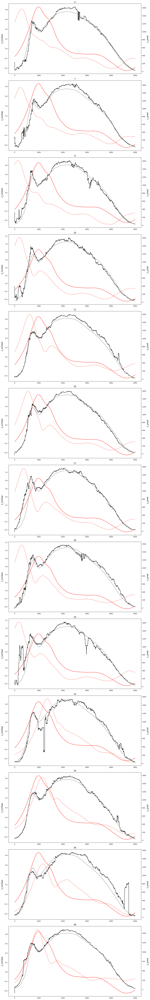

In [29]:
fig, ax = plt.subplots(nrows=len(list1), figsize=(13.8,len(list1)*7))
k=perf_pred
for i in list1:
    ind = list1.index(i)
    ax2 = ax[ind].twinx()

    ax[ind].plot(df['z_lumbar'].iloc[i*5000:i*5000+5000].reset_index(drop=True), color='#FA8072')
 
    ax[ind].plot(df['z_lumbar'].iloc[k*5000:k*5000+5000].reset_index(drop=True), color='#FF0800')
    
    ax[ind].set_ylabel('z_lumbar',fontsize=14)
    ax2.plot( df['z_pred'].iloc[i*5000:i*5000+5000].reset_index(drop=True),color='black')
    ax2.plot(y.iloc[k*5000:k*5000+5000].reset_index(drop=True), color='grey')
    ax2.set_ylabel('z_pred ',color='black',fontsize=14)
    ax[ind].set_title(i, size=14)
    ax[ind].xaxis.set_tick_params(labelsize=10)
    ax[ind].yaxis.set_tick_params(labelsize=10)

plt.tight_layout()

### Comparing input on satisfying prediction vs prediction with  dropouts
#### For tibia:  
*(blue: x_lumbar, red: y_lumbar, green: z_lumbar)*
- Light colors= prediction with droouts (input)  
- Deep colors= "perfect" prediction (input)   

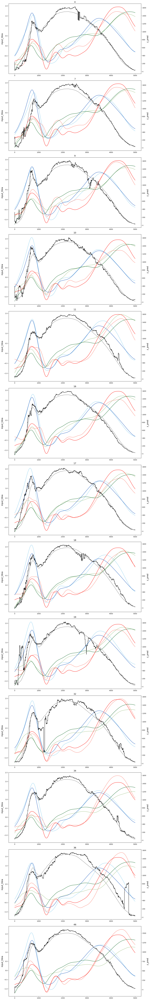

In [14]:
fig, ax = plt.subplots(nrows=len(list1), figsize=(13.8,len(list1)*7))
k=perf_pred
for i in list1:
    ind = list1.index(i)
    ax2 = ax[ind].twinx()
    ax[ind].plot(df['x_tibia'].iloc[i*5000:i*5000+5000].reset_index(drop=True), color='#89CFEF')
    ax[ind].plot(df['y_tibia'].iloc[i*5000:i*5000+5000].reset_index(drop=True), color='#FA8072')
    ax[ind].plot(df['z_tibia'].iloc[i*5000:i*5000+5000].reset_index(drop=True), color='#9DC183')
    
    ax[ind].plot(df['x_tibia'].iloc[k*5000:k*5000+5000].reset_index(drop=True), color='#0F52BA')
    ax[ind].plot(df['y_tibia'].iloc[k*5000:k*5000+5000].reset_index(drop=True), color='#FF0800')
    ax[ind].plot(df['z_tibia'].iloc[k*5000:k*5000+5000].reset_index(drop=True), color='#0B6623')
    
    ax[ind].set_ylabel('input_tibia',fontsize=14)
    ax2.plot( df['z_pred'].iloc[i*5000:i*5000+5000].reset_index(drop=True),color='black')
    ax2.plot(y.iloc[k*5000:k*5000+5000].reset_index(drop=True), color='grey')
    ax2.set_ylabel('z_pred ',color='black',fontsize=14)
    ax[ind].set_title(i, size=14)
    ax[ind].xaxis.set_tick_params(labelsize=10)
    ax[ind].yaxis.set_tick_params(labelsize=10)

plt.tight_layout()

## Computing mean standard deviation for the predit 
Mean of std of the 5000 points

In [15]:
df_passages=pd.DataFrame()
#Creating a table with each column being a the z_force measure (with the plateform) for 1passage
for i in range(100):
    df_passages[i]=y.iloc[i*5000:i*5000+5000].reset_index(drop=True)
#Storing the describe table of the transpose (allow to acces the mean, sd by point: from 0 to 5000)
df_passage_decribe=df_passages.T.describe()
#Transpose to get the "std" column accesible easily
df_passage_decribe_col=df_passage_decribe.T
df_passage_decribe_col.head()

,count,mean,std,min,25%,50%,75%,max
0,100.0,28.134811,4.942315,18.936380,24.233629,27.743821,32.478816,40.090054
1,100.0,29.329797,4.861301,20.332341,25.291978,28.891312,33.533976,40.216296
2,100.0,30.493910,4.825572,21.537782,26.331031,30.510076,34.611462,40.409057
3,100.0,31.627524,4.826344,22.359491,27.397937,31.979153,35.734937,41.081565
4,100.0,32.731014,4.855313,23.196130,28.337969,33.232627,36.798839,42.033474


In [16]:
#Getting the mean of the standard variation of each point 
mean_sd_passage=df_passage_decribe_col['std'].mean(skipna = True)
mean_sd_passage

44.86465816207118

## Creating the min and max bounds 

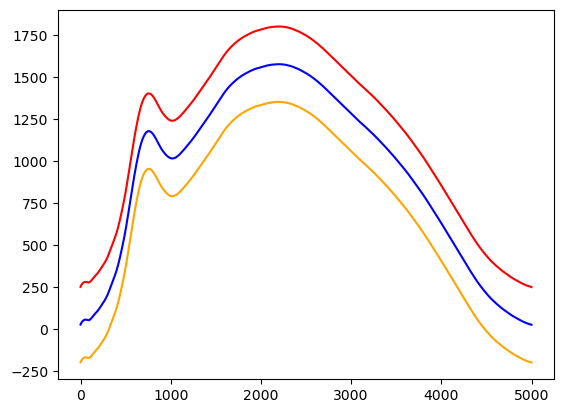

In [31]:
#Choosing the band width by increasing weight on the mean std (relative to the mean computed with the prediction)
list_min=list_mean-mean_sd_passage*5
list_max=list_mean+mean_sd_passage*5
#plotting the bounds
fig, ax = plt.subplots()
ax.plot(list_min, color='orange')
ax.plot(list_mean,color='blue')
ax.plot(list_max,color='red')
plt.show()

## Removing dropout 
### Checking if the prediction is between the bounds
If not, replaced ( if < bound_min then = bound mean /same for max)

In [32]:
d0=pd.Series([])
range_size=100
for i in range(range_size):
    p=df['z_pred'].iloc[i*5000:i*5000+5000].reset_index(drop=True)
    p=p.where(((p>list_min)) ,list_min)
    p=p.where(((p<list_max)) ,list_max)
    d0=pd.concat([d0,p])
    d0=d0.reset_index(drop=True)
df['z_pred_no_drop']=d0

C:\Users\solen\AppData\Local\Temp\ipykernel_27196\3932671372.py:1: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  d0=pd.Series([])


## Plotting original prediction vs predition without dropout
Only displaying for the cas with worst dropouts

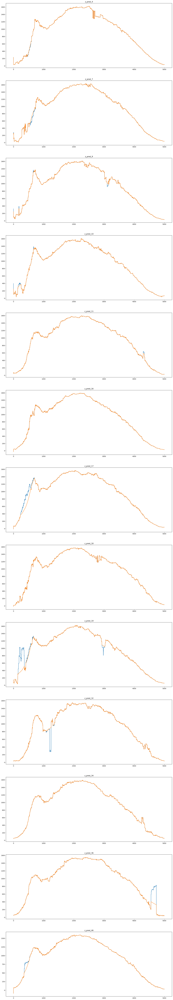

In [33]:
#Plotting the predition (with dropout) with the corrected curve
df['z_pred']=predict_lgbmr
fig,axes = plt.subplots(len(list1),1,figsize=(20,120))
j=0
for i in list1:
    df['z_pred'].iloc[i*5000:i*5000+5000].reset_index(drop=True).plot(ax=axes[j],title=f'z_pred_{i}')
    df['z_pred_no_drop'].iloc[i*5000:i*5000+5000].reset_index(drop=True).plot(ax=axes[j],title=f'z_pred_{i}')
    j+=1


## Smoothing with mean average 

In [20]:
#Using a window being 1/100 of the number of data 
df['z_pred_smooth']=df['z_pred']
wind=51 #from 201 to 51
windna=int((wind-1)/2)
for i in range(100):
    df['z_pred_smooth'].iloc[i*5000+windna:i*5000+5000-windna]=df['z_pred_no_drop'].iloc[i*5000:i*5000+5000].rolling(wind,center=True).mean().iloc[windna:-windna]

C:\Users\solen\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


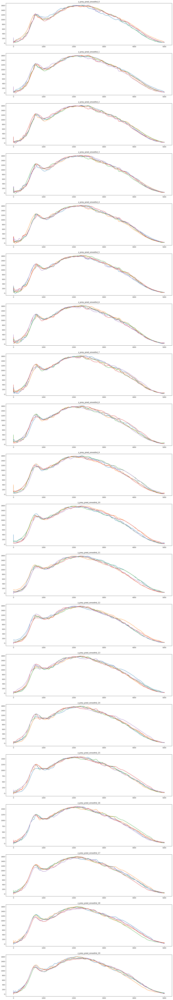

In [21]:
fig,axes = plt.subplots(20,1,figsize=(20,120))
for i in range(20):
    df['z_pred_smooth'].iloc[i*5000:i*5000+5000].reset_index(drop=True).plot(ax=axes[i],title=f'z_pred_{i}')
    df['z_pred_smooth'].iloc[(i+1)*5000:(i+1)*5000+5000].reset_index(drop=True).plot(ax=axes[i],title=f'z_pred_{i}')
    df['z_pred_smooth'].iloc[(i+2)*5000:(i+2)*5000+5000].reset_index(drop=True).plot(ax=axes[i],title=f'z_pred_{i}')
    df['z_pred_smooth'].iloc[(i+3)*5000:(i+3)*5000+5000].reset_index(drop=True).plot(ax=axes[i],title=f'z_pred_{i}')
    df['z_pred_smooth'].iloc[(i+4)*5000:(i+4)*5000+5000].reset_index(drop=True).plot(ax=axes[i],title=f'z_prey_pred_smoothd_{i}')

## Result: evolution 

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
print("MSE:")
print('Raw:',round(mean_squared_error(df['z_force'],df['z_pred'])**(1/2),),'N       No drop:',round(mean_squared_error(df['z_force'],df['z_pred_no_drop'])**(1/2),2),'N    Smooth:',round(mean_squared_error(df['z_force'],df['z_pred_smooth'])**(1/2),2),'N\n')
print("Score:")
print('Raw:',round(r2_score(df['z_force'],df['z_pred']),5)*100,'%   No drop:',round(r2_score(df['z_force'],df['z_pred_no_drop']),5)*100,'%   Smooth:',round(r2_score(df['z_force'],df['z_pred_smooth']),5)*100,'%')